# Supplementary code for paper "Interpretable Recognition of Cognitive Distortions in Natural Language Texts" - Babacan dataset

In [1]:
import os, sys
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import datetime as dt
import plotly.graph_objects as go

#force reimport
if 'api' in sys.modules:
    del sys.modules['api']
if 'plot' in sys.modules:
    del sys.modules['plot']
if 'util' in sys.modules:
    del sys.modules['util']
if 'recognition_evaluators' in sys.modules:
    del sys.modules['recognition_evaluators']

from api import TextMetrics, load_ngrams, punct, tokenize_re, build_ngrams, Learner
from plot import plot_dict, plot_dict_bars, matrix_plot, plot_bar_from_list, \
    build_triple_list, build_triple_matrix, plot_bar_from_list_minmax
from util import dictcount, contains_seq, agg_min_max_avg_mpe
from recognition_evaluators import df2labeled, language_metrics, our_evaluator_test, our_evaluator_tm, our_evaluator_top, \
    our_evaluator_true, our_evaluator_false, our_evaluator_random, pre_rec_f1_from_counts, evaluate_tm_df, evaluate_metrics, evaluate_model, \
    full_test_circle, dictval, our_evaluator_top1, summarize_full_test_circle

grand_t0 = dt.datetime.now()

[nltk_data] Error loading punkt: <urlopen error [SSL:
[nltk_data]     CERTIFICATE_VERIFY_FAILED] certificate verify failed:
[nltk_data]     unable to get local issuer certificate (_ssl.c:1006)>


In [2]:
# Paper section: "Models with Data Provided" 
# authors provided combined dataset consisting ... for multiple distortions (Babacan 2024) using the RoBERTa 
# model (Babacan, O˘guz, and Beyito˘glu 2025) reporting F 1=0.77 on multi-class recognition task

from datasets import load_dataset

DS = 'Babakan24'

# dataset: https://huggingface.co/datasets/halilbabacan/combined_synthetic_cognitive_distortions/tree/main
ds = load_dataset(
    "halilbabacan/combined_synthetic_cognitive_distortions",
    split="train",
)

df = ds.to_pandas()
df = df.rename(columns={'text': 'Patient Question', 'label': 'Dominant Distortion'})
df.insert(1, 'Distorted part', value = np.nan)
df.insert(3, 'Secondary Distortion (Optional)', value = np.nan)
# Remove the row with index 738 because it contains a NaN in the text column
df = df.drop(index=738)


mapping = {
    "Labelling":            "Labeling",
    "Mental Filter":        "Mental filter",
    "Should Statements":    "Should statements",
    "All-or-Nothing Thinking": "All-or-nothing thinking"
}

df['Dominant Distortion'] = df['Dominant Distortion'].map(mapping).fillna(df['Dominant Distortion'])


validation_fraction = 5
held_fraction = 5 # withheld test set
train_df = df[df.index % held_fraction != 0].reset_index(drop=True)
held_df  = df[df.index % held_fraction == 0].reset_index(drop=True)

print('Total',len(df))
print('Train and validation',len(train_df))
print('Withheld test',len(held_df))

df = train_df
df

README.md:   0%|          | 0.00/103 [00:00<?, ?B/s]

combined_dataset_updated.csv: 0.00B [00:00, ?B/s]

Generating train split:   0%|          | 0/4531 [00:00<?, ? examples/s]

Total 4530
Train and validation 3623
Withheld test 907


,Patient Question,Distorted part,Dominant Distortion,Secondary Distortion (Optional)
0,"During the meeting, Sarah didn't look at me on...",NaN,Mind Reading,NaN
1,Mike didn't respond to my text right away He m...,NaN,Mind Reading,NaN
2,Jessica didn't smile when she saw me She must ...,NaN,Mind Reading,NaN
3,Tom didn't invite me to his party He must not ...,NaN,Mind Reading,NaN
4,Anna didn't laugh at my joke She must think I'...,NaN,Mind Reading,NaN
...,...,...,...,...
3618,"However, I am not happy, at the least only hal...",NaN,Labeling,NaN
3619,I’m a 21 year old female. I spent most of my l...,NaN,No Distortion,NaN
3620,Now I am at university my peers around me all ...,NaN,Overgeneralization,NaN
3621,He claims he’s severely depressed and has outb...,NaN,Mental filter,NaN


defaultdict(<function <lambda> at 0x17ad81bc0>, {'Mind Reading': 90, 'Overgeneralization': 86, 'Magnification': 73, 'Labeling': 82, 'Personalization': 70, 'Fortune-telling': 75, 'Emotional Reasoning': 62, 'Mental filter': 65, 'Should statements': 59, 'All-or-nothing thinking': 64, 'No Distortion': 181})


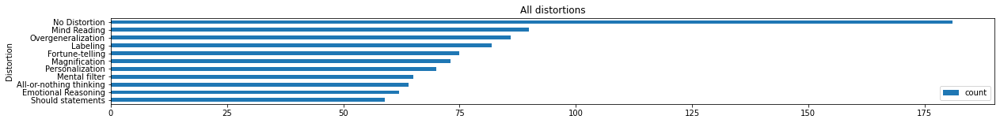

In [3]:
from collections import defaultdict
all_distortions = defaultdict(lambda: defaultdict(int))  # A separate dictionary is created for each distortion (distortion-token-token_frequency)

# Loop through the rows of the DataFrame
for _, row in held_df.iterrows():
    # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
    text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
    primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
    secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else None  # The secondary distortion from the 4th column, if it exists

    dictcount(all_distortions,primary_distortion)
    if secondary_distortion:
        dictcount(all_distortions,secondary_distortion)

print(all_distortions)
plot_dict(
            all_distortions,
            labels="Distortion",
            values="count",
            title=f"All distortions",
            head=20             # All
    )

In [4]:
#Paper Section: "Experimental Setup"

model_multiclass_path = f'../../data/models/distortions/shreevastava2021h{held_fraction}'
model_name = 'multiclass'
rescale = False
inclusion_thresholds = [0,10,20,30,40,50,60,70,80,90]
detection_thresholds = [10,20,30,40,50,60,70,80,90]
selection_metrics = ['F','UF','FN','UFN','TF-IDF','FCR','CFR','MR','NLMI']
n_max_values = [1,2,3,4,5]
splits = [0,1,2]

if not os.path.exists(model_multiclass_path):
    os.makedirs(model_multiclass_path)
print(model_multiclass_path)

../../data/models/distortions/shreevastava2021h5


# Grid search
## Perform a grid search over all hyper-parameters to determine the best combination for building the model
### Non-Weighted Model and Recognition

In [5]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=False,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Disto

In [6]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary = sorted(summary, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary[0][:4]
F1 = summary[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary[:20]:
    print(s)


DS=Babakan24, NM=2, IT=90, SM=MR, DT=40, F1=0.8864317282370665

(2, 90, 'MR', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(3, 90, 'MR', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(4, 90, 'MR', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(5, 90, 'MR', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(2, 90, 'NLMI', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(3, 90, 'NLMI', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(4, 90, 'NLMI', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(5, 90, 'NLMI', 40, 0.8700345065562456, 0.8983870408324023, 0.8864317282370665, 1.2332005694660486)
(2, 90, 'MR', 30, 0.8654424323720098, 0.8941127855228046, 0.883844132467367, 1.388004922239436)
(3, 90, 'MR', 30, 0.8654424323720098, 0.89411278

Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})


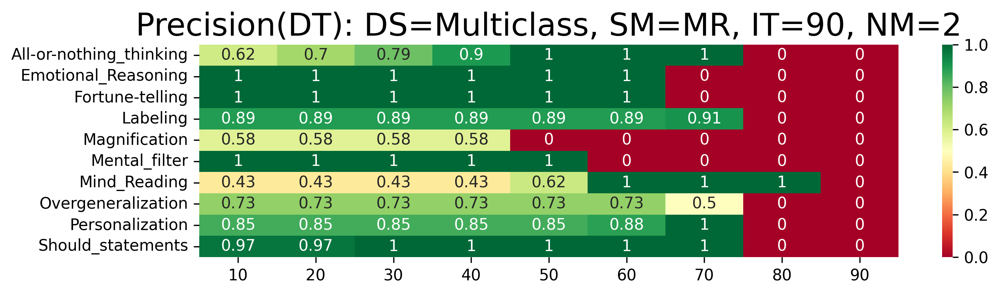

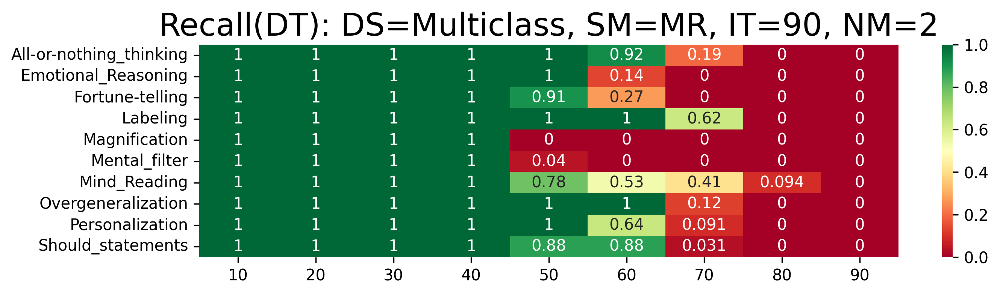

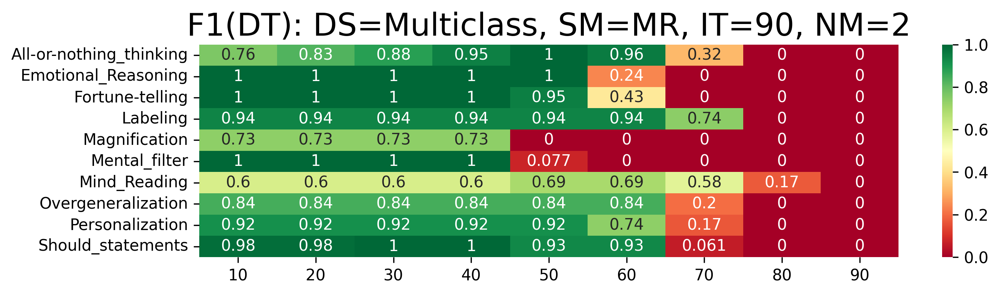

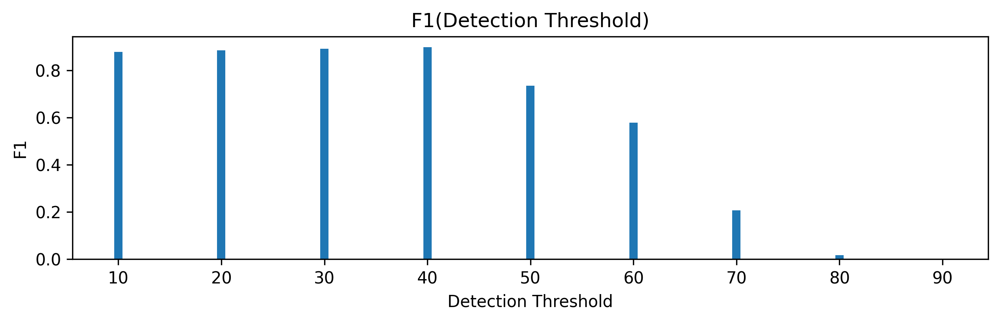

In [7]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=False,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

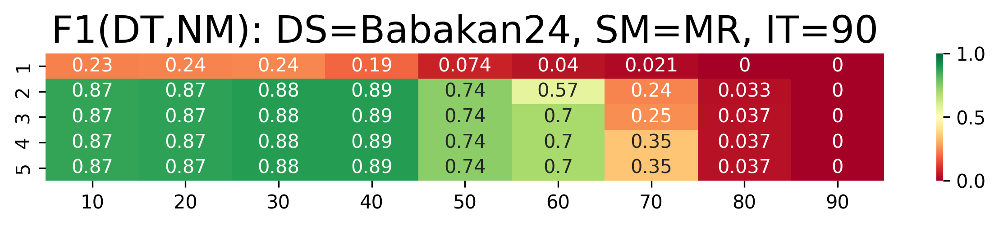

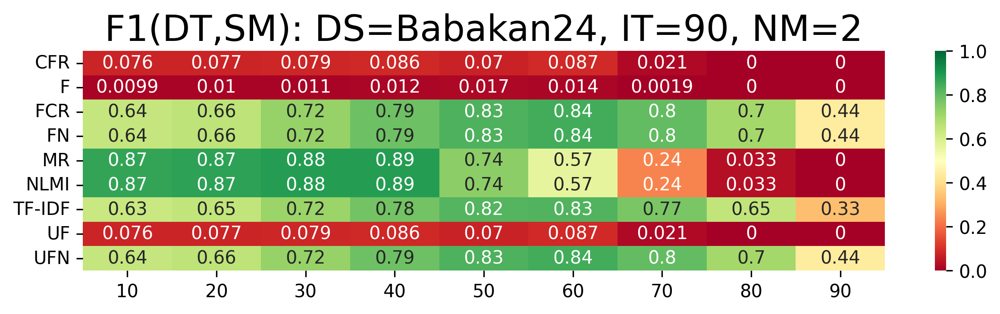

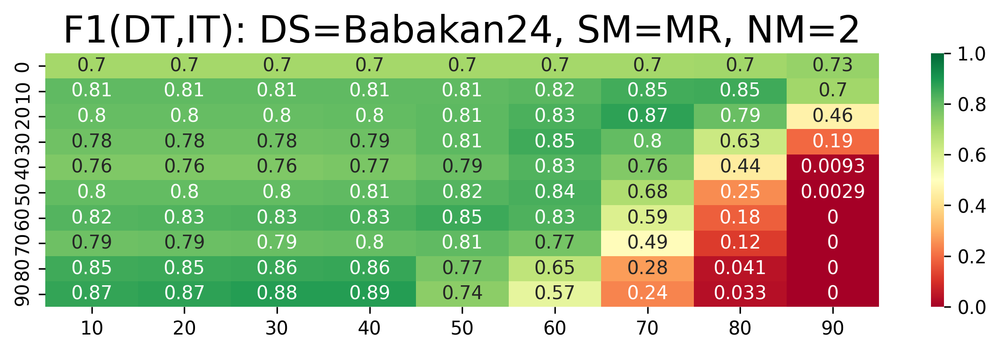

In [8]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


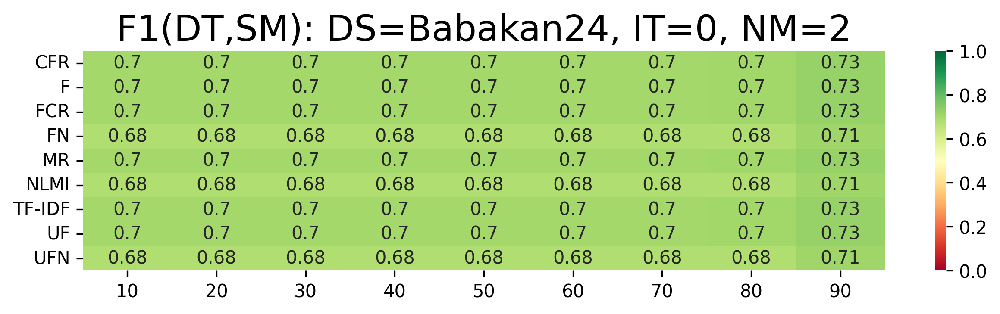

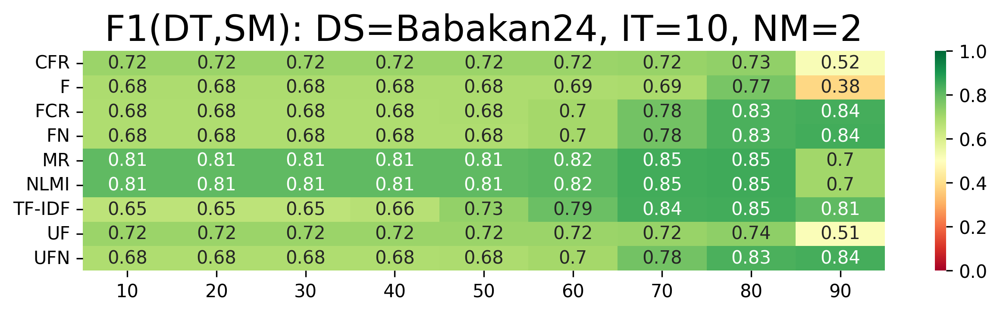

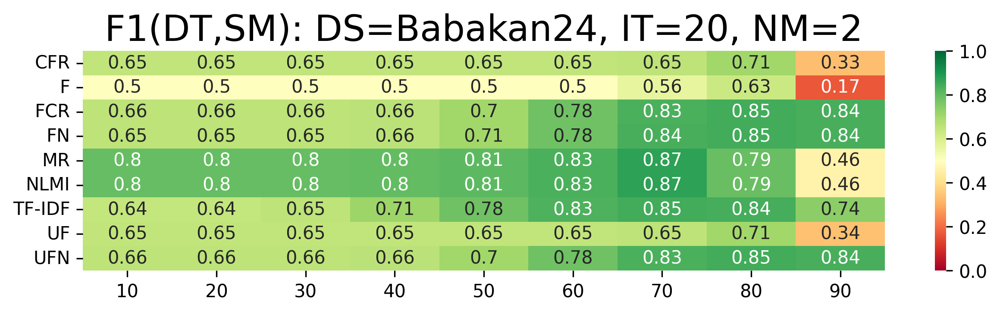

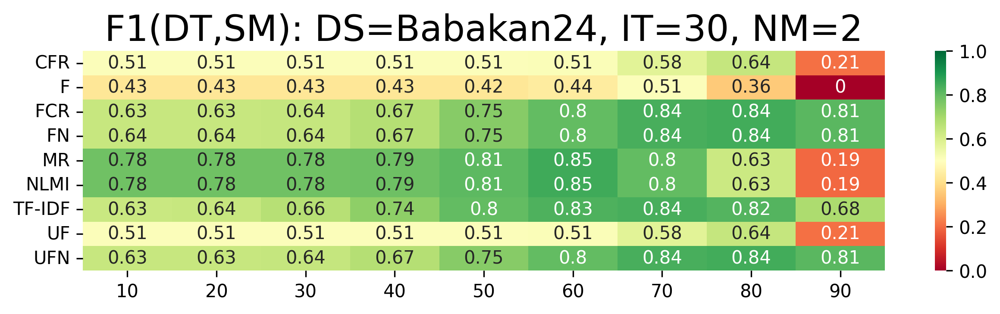

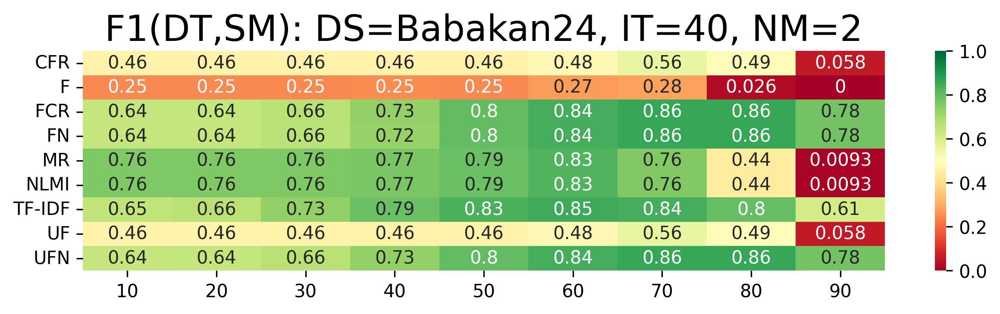

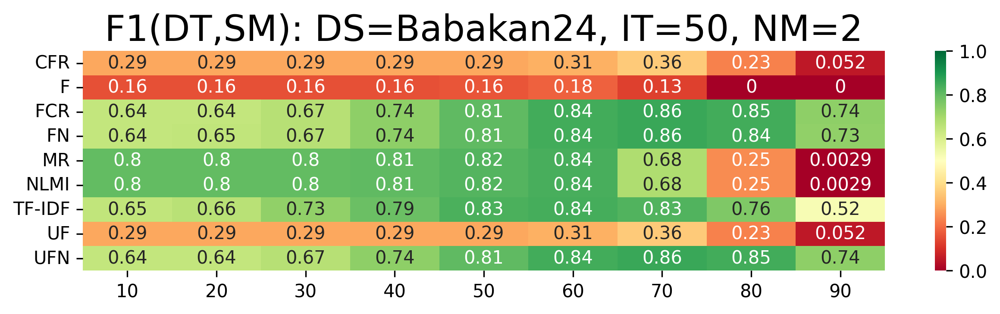

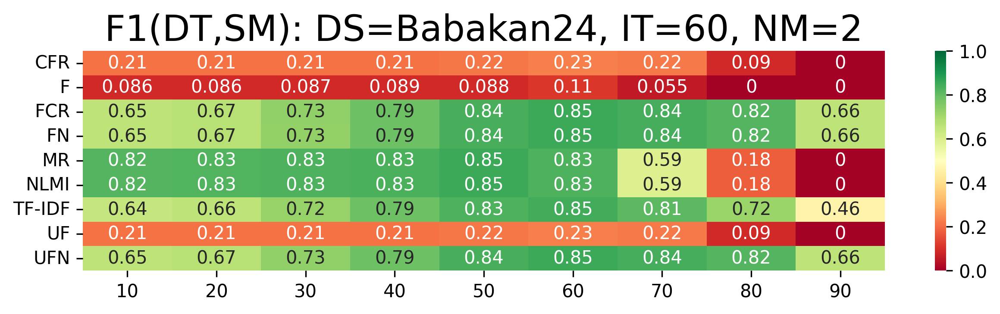

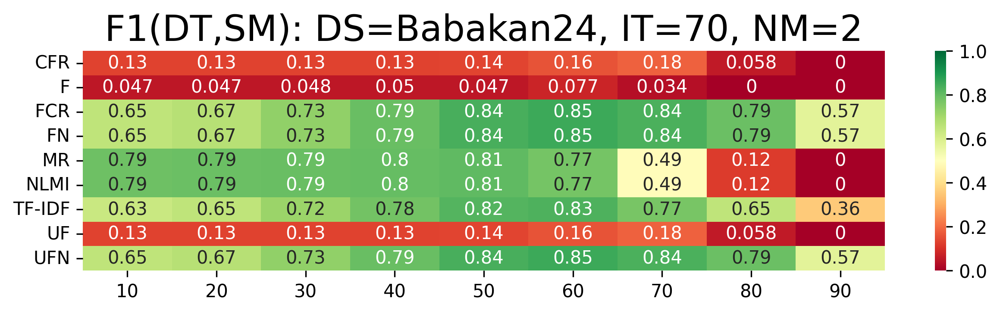

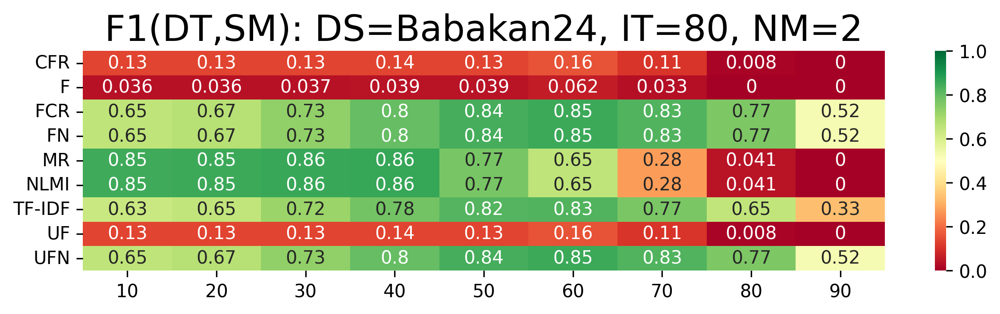

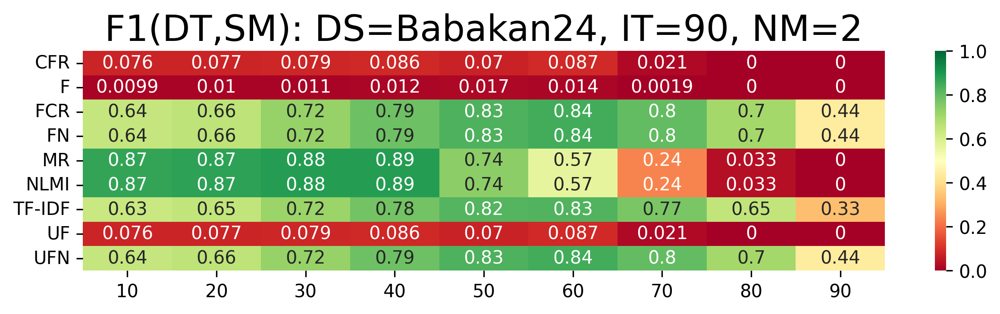

In [9]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


### Weighted Model and Recognition

In [10]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=True,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Disto

In [11]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary_weighted = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_weighted = sorted(summary_weighted, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary_weighted[0][:4]
F1 = summary_weighted[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary_weighted[:20]:
    print(s)

DS=Babakan24, NM=2, IT=40, SM=FN, DT=70, F1=0.8644610716773361

(2, 40, 'FN', 70, 0.8639577661729472, 0.8651420513295918, 0.8644610716773361, 0.052516700833743726)
(2, 40, 'FCR', 70, 0.8625937423025295, 0.8642833975294698, 0.8635103653078319, 0.07076718799051668)
(2, 40, 'UFN', 70, 0.8625937423025295, 0.8642833975294698, 0.8635103653078319, 0.07076718799051668)
(1, 20, 'FCR', 40, 0.8421535505034294, 0.8913216520338677, 0.861154902214354, 2.3353715451922783)
(1, 20, 'UFN', 40, 0.8421535505034294, 0.8913216520338677, 0.861154902214354, 2.3353715451922783)
(1, 20, 'FN', 40, 0.8433679732653607, 0.8874290071001388, 0.859257784761407, 2.185702035589087)
(2, 60, 'FN', 60, 0.8510711806771619, 0.8652438248870951, 0.858137197574261, 0.5520972118772868)
(2, 70, 'FN', 60, 0.8498110310754619, 0.8632396317770615, 0.8576629633911294, 0.610335500915296)
(2, 60, 'FCR', 60, 0.8510711806771619, 0.8652438248870951, 0.8575739615271539, 0.5962450435009872)
(2, 60, 'UFN', 60, 0.8510711806771619, 0.8652438248

Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})


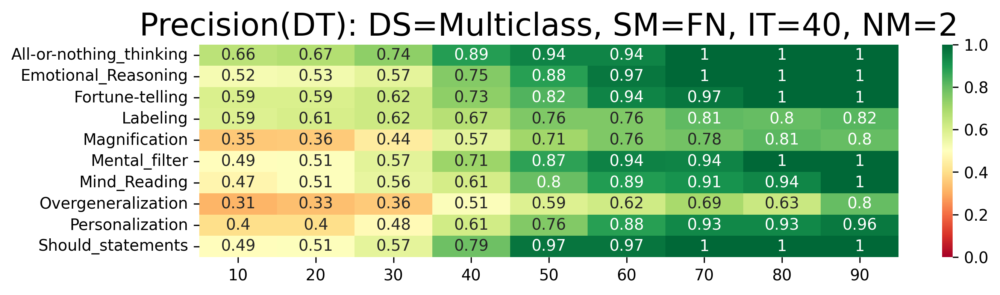

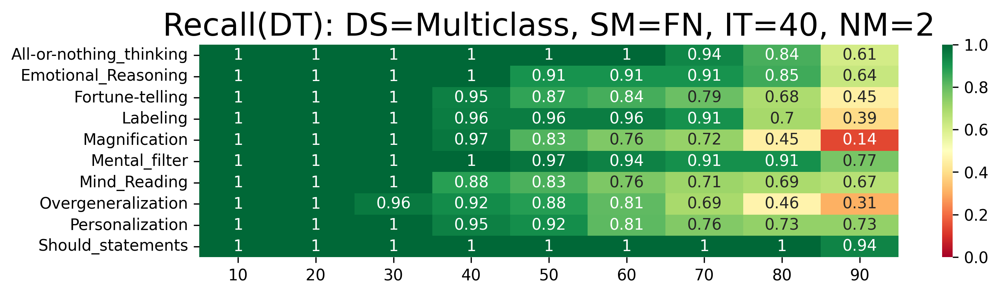

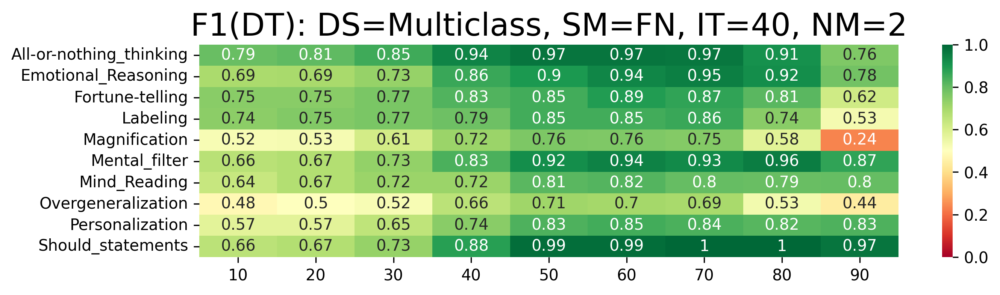

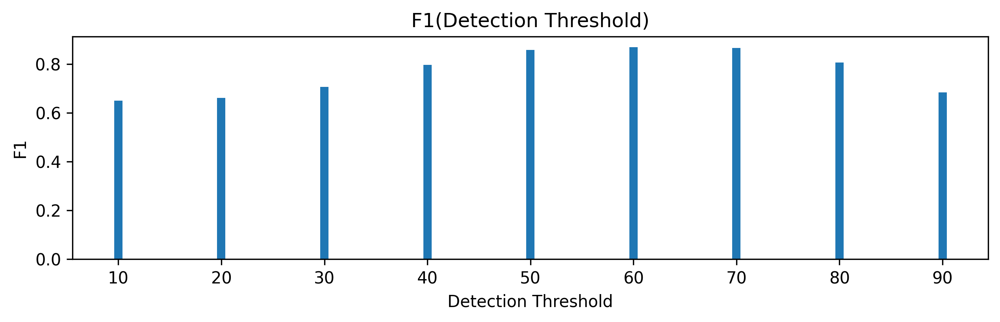

In [12]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

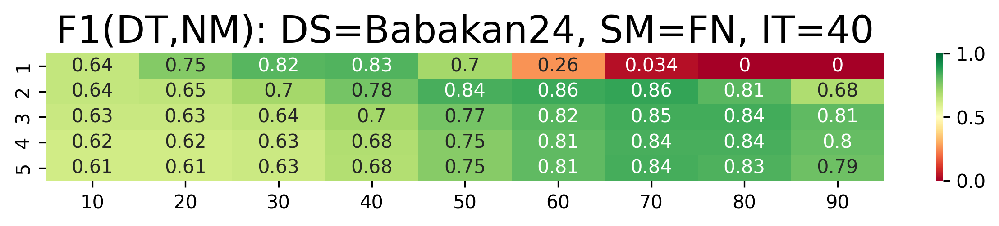

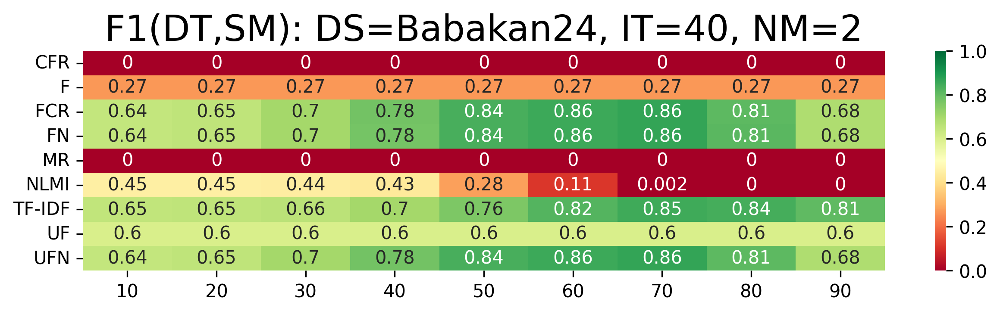

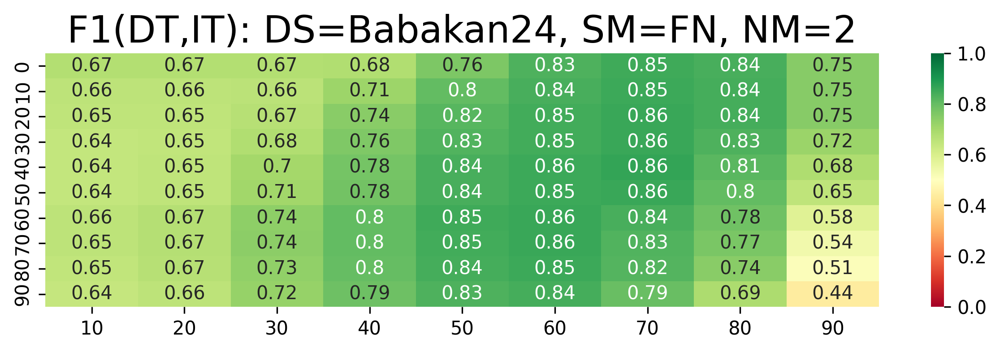

In [13]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary_weighted,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


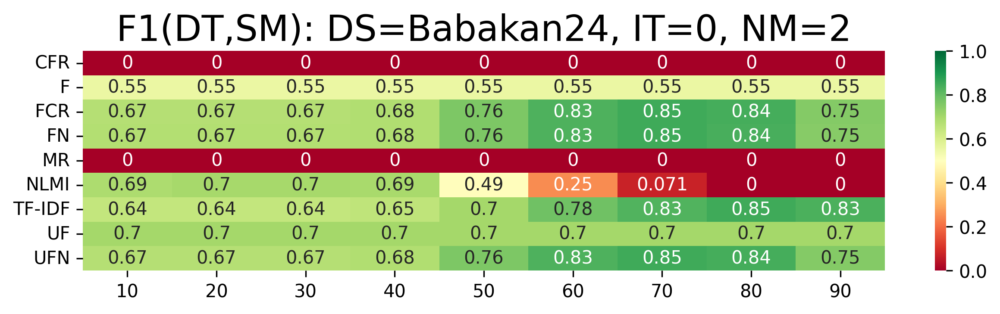

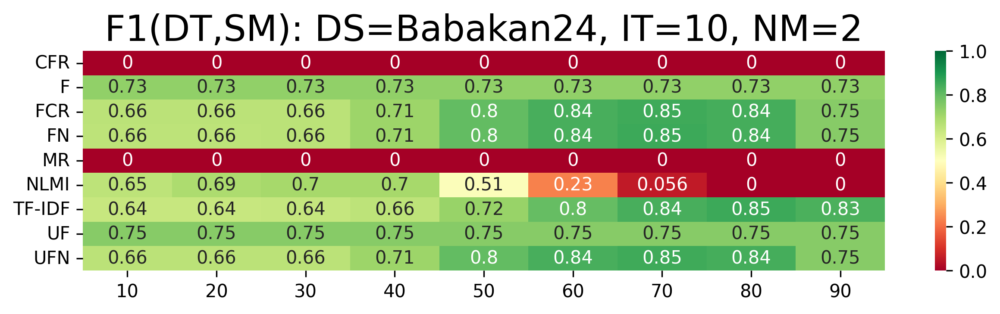

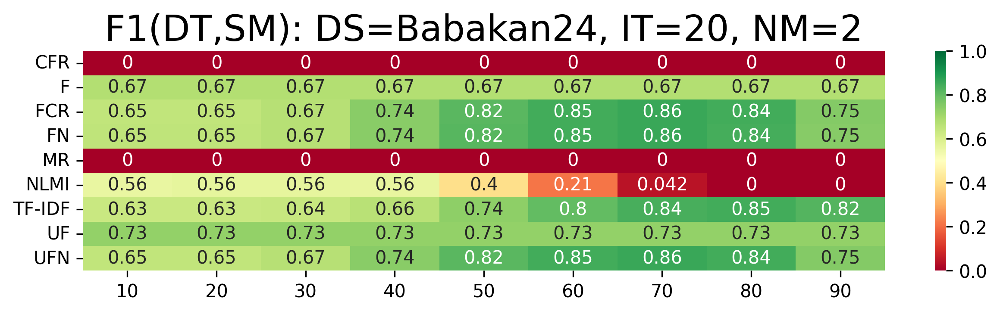

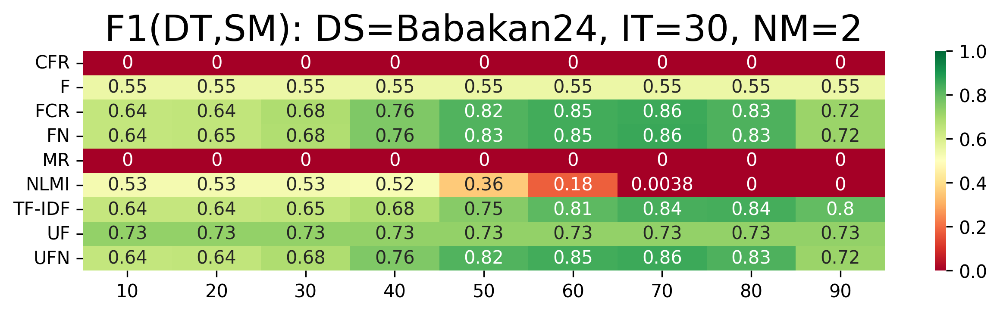

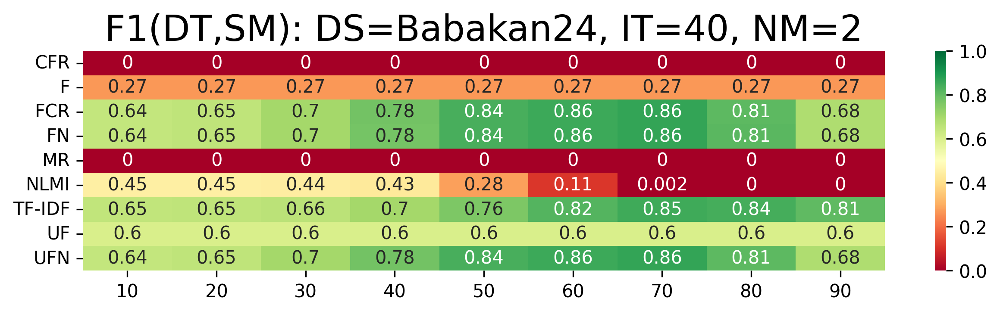

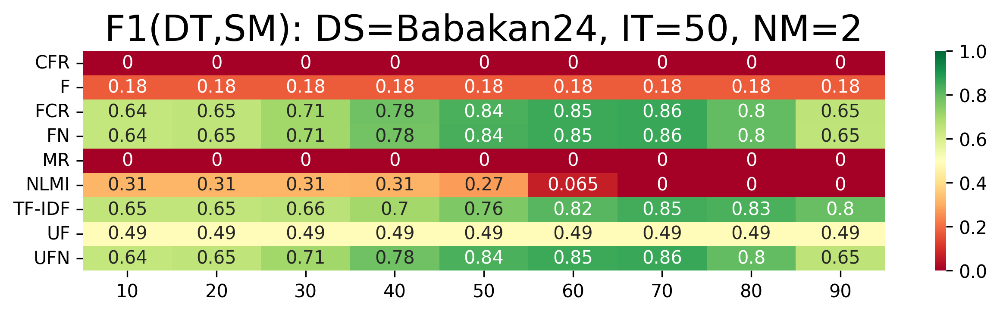

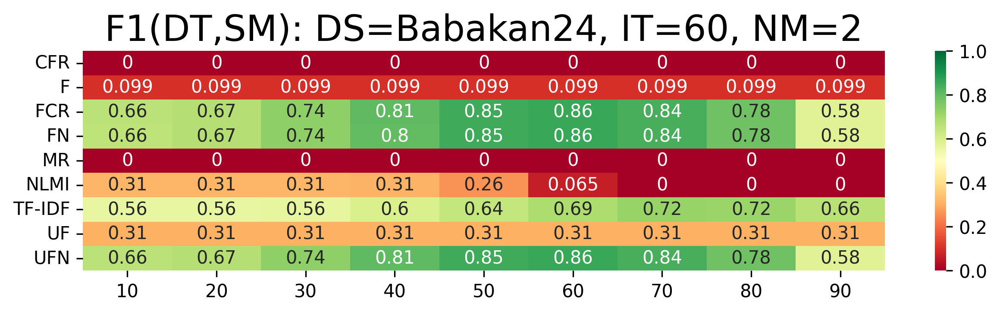

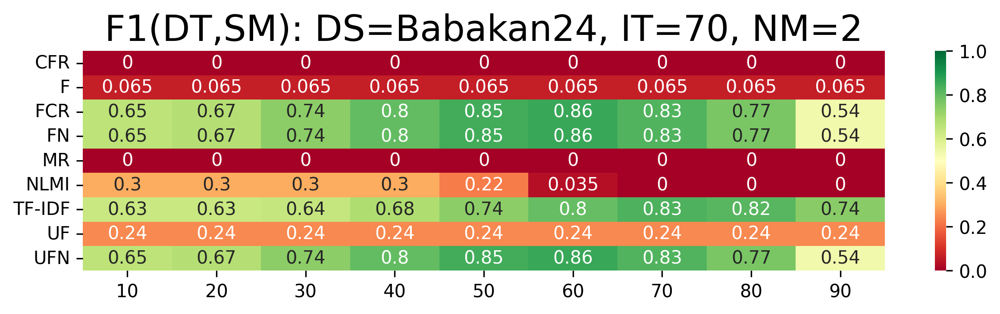

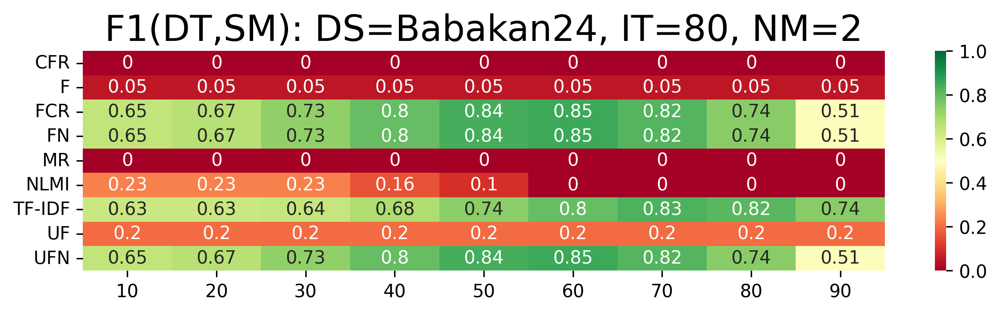

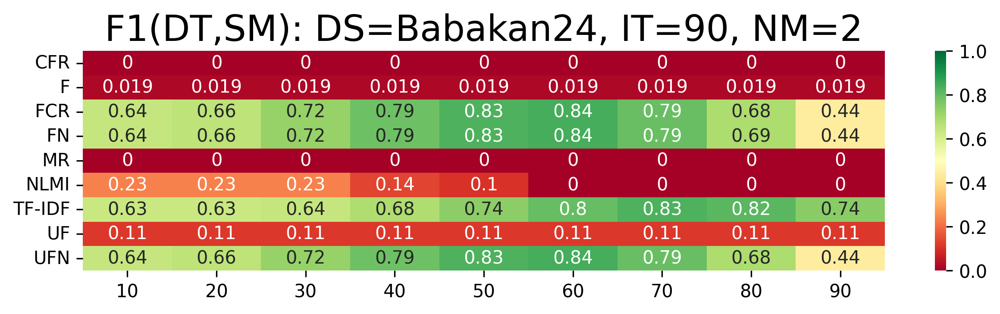

In [14]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


## Summary

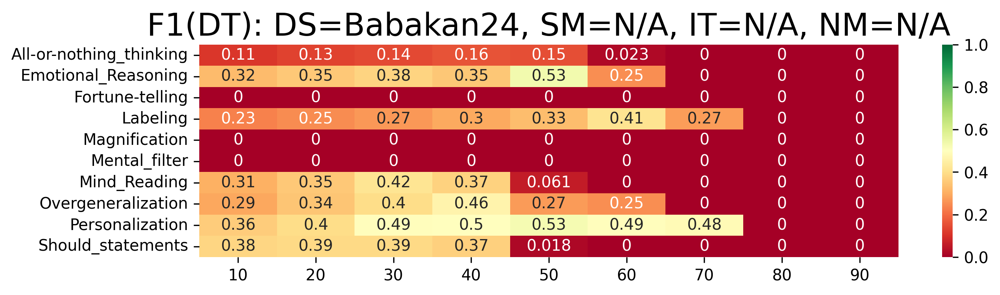

('N/A', 'N/A', 'N/A', 40, 0.2502198983586219, {'All-or-nothing_thinking': 0.15816326530612243, 'Emotional_Reasoning': 0.3478260869565218, 'Fortune-telling': 0, 'Labeling': 0.2962962962962963, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0.37209302325581395, 'Overgeneralization': 0.4615384615384615, 'Personalization': 0.496124031007752, 'Should_statements': 0.3701578192252511})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.16, 0.35, 0, 0.3, 0, 0, 0.37, 0.46, 0.5, 0.37]


In [65]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)

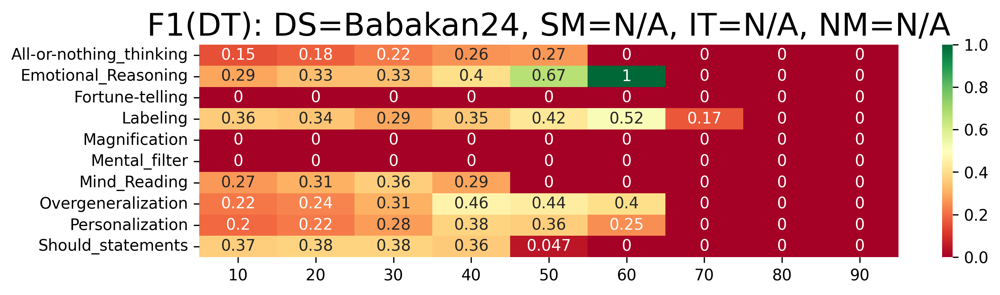

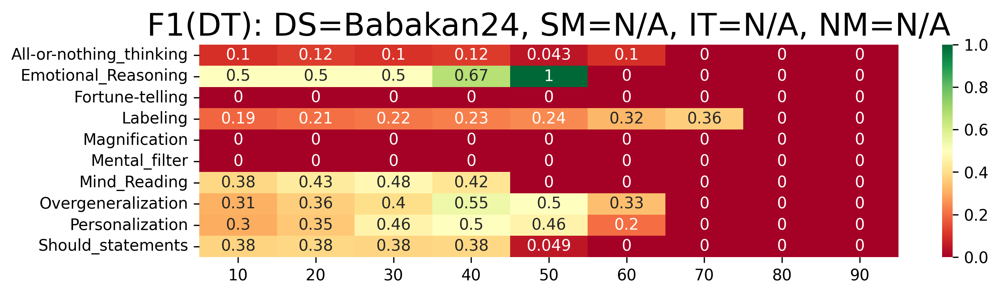

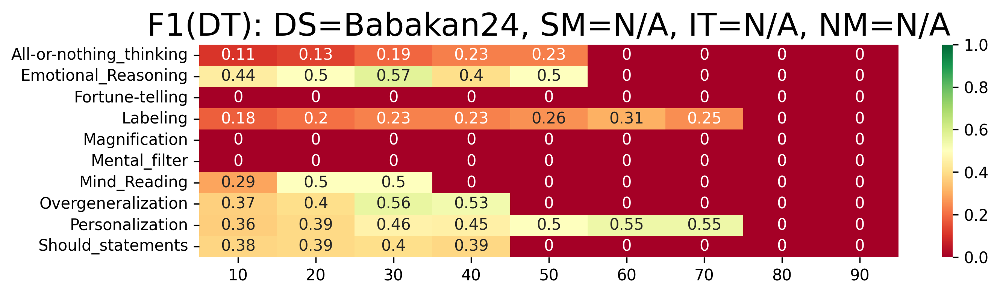

In [66]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % validation_fraction == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

In [67]:
# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

('N/A',
 'N/A',
 'N/A',
 30,
 0.2169412962516411,
 0.2906200562722302,
 0.25390346884375153,
 9.70504597946406)

In [68]:
# Enter baseline F1 performance from the paper (Babacan, O˘guz, and Beyito˘glu 2025)
# https://dergipark.org.tr/tr/download/article-file/3865878, page 7

base_babakan = {'Mind_Reading': 0.8121,
'Overgeneralization': 0.6047,
'Magnification': 0.6483,
'Labelling': 0.8372,
'Personalization': 0.6946,
'Fortune-telling': 0.8193,
'Emotional_Reasoning': 0.6462,
'Mental_filter': 1.0000,
'Should_statements': 1.0000,
'All-or-nothing_thinking': 1.0000,
'Labeling': 0.4167}

numbers_babakan = [round(base_babakan[label],2) for label in labels]
print(numbers_babakan)

[1.0, 0.65, 0.82, 0.42, 0.65, 1.0, 0.81, 0.6, 0.69, 1.0]


2 40 FN 70
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})


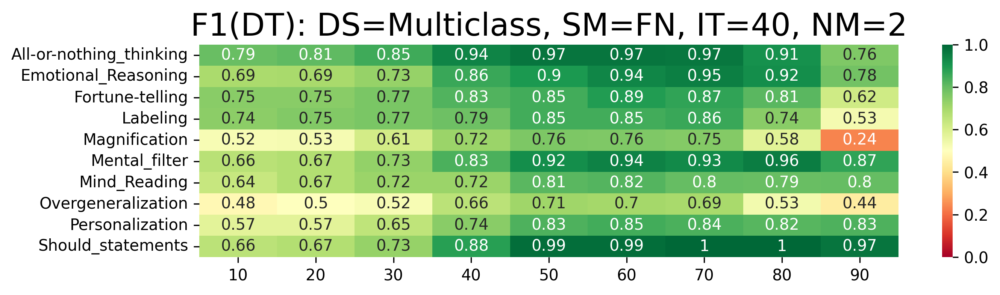

(2, 40, 'FN', 60, 0.8693428437468753, {'All-or-nothing_thinking': 0.96875, 'Emotional_Reasoning': 0.9374999999999999, 'Fortune-telling': 0.8888888888888888, 'Labeling': 0.8461538461538461, 'Magnification': 0.7586206896551724, 'Mental_filter': 0.9428571428571428, 'Mind_Reading': 0.8205128205128205, 'Overgeneralization': 0.7, 'Personalization': 0.8450704225352113, 'Should_statements': 0.9850746268656716})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.97, 0.94, 0.89, 0.85, 0.76, 0.94, 0.82, 0.7, 0.85, 0.99]


In [69]:
# Re-compute distiortion-specific F1 performances

print(NM,IT,SM,DT) # 2 10 FCR 70
shift = 0

accumulator = []
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True, f1_score=True, split_shift=shift, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_ours = [round(best[5][label],2) for label in labels]
print(numbers_ours)

In [70]:
# Visualize distiortion-specific F1 performances

metric_names = labels
model_metrics = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}
fig = go.Figure()
for i in range(len(labels)):
    fig.add_trace(go.Bar(
        name=metric_names[i],
        x=list(model_metrics), y=[model_metrics[m][i] for m in model_metrics],
    ))
fig.update_layout(
    barmode='group', # Group bars by model
    title='F1 by model and label', # Add a title
    xaxis_title='Model', # Label the x-axis
    yaxis_title='F1', # Label the y-axis
    hovermode='closest' # Improve hover behavior
)
fig.show()

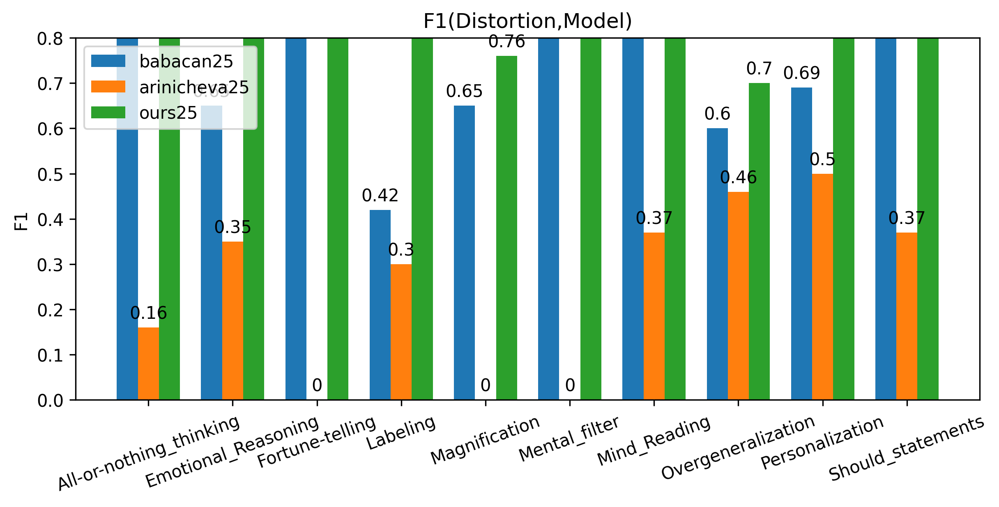

In [71]:
# Visualize distiortion-specific F1 performances

# Paper Figure 4

values = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}

plt.rcParams["figure.figsize"] = (8,4)

x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in values.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1')
ax.set_title('F1(Distortion,Model)')
ax.set_xticks(x + width, labels)
ax.legend(loc='upper left')#, ncols=3)
ax.set_ylim(0, 0.8)
ax.tick_params(axis='x', rotation=20)
fig.set_dpi(300)

plt.show()

F1 babacan25: 0.7639999999999999
F1 arinicheva25: 0.25390346884375153%
F1 ours25: 0.8864317282370665%
F1 ours25-weighted: 0.8644610716773361%
MPE arinicheva25: 9.70504597946406%
MPE ours25: 1.2332005694660486%
MPE ours25-weighted: 0.052516700833743726%


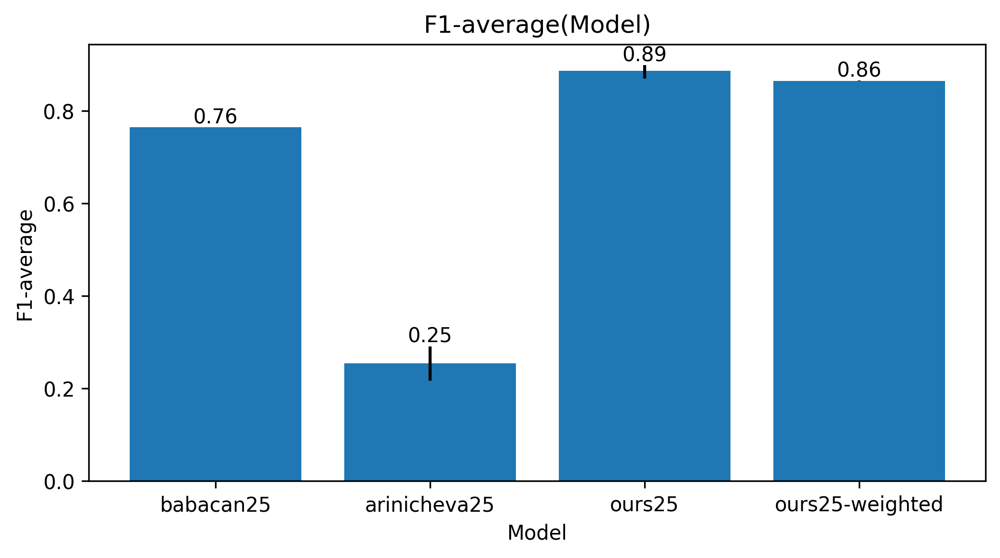

In [72]:
# Visualize grand baseline and our peformances, refering to papers 
# (Arinicheva and Kolonin 2025; Babacan, O˘guz, and Beyito˘glu 2025) 

# Paper Figure 2

# https://dergipark.org.tr/tr/download/article-file/3865878, page 7
f1_babakan = sum(numbers_babakan)/len(numbers_babakan)
print(f'F1 babacan25: {f1_babakan}')
print(f'F1 arinicheva25: {summary_base[0][6]}%')
print(f'F1 ours25: {summary[0][6]}%')
print(f'F1 ours25-weighted: {summary_weighted[0][6]}%')
print(f'MPE arinicheva25: {summary_base[0][7]}%')
print(f'MPE ours25: {summary[0][7]}%')
print(f'MPE ours25-weighted: {summary_weighted[0][7]}%')
plot_bar_from_list_minmax('Model',['babacan25','arinicheva25','ours25','ours25-weighted'],
                          'F1-average',[f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5])])

# Illustrate Explainabillity-Intepretability Markup

In [73]:
#https://stackoverflow.com/questions/35731194/how-to-highlight-a-word-found-in-a-text-file
def get_fragment_indexes(text,ngrams):
    text = text.lower()
    pats = [' '.join(ngram) for ngram in ngrams]
    minpos = len(text)
    maxpos = 0
    for pat in pats:
        startpos = text.find(pat)
        if startpos > -1:
            endpos = startpos + len(pat)
            if minpos > startpos:
                minpos = startpos
            if maxpos < endpos:
                maxpos = endpos
    return minpos, maxpos


def highlight_text_console(text,ngrams,backcolor,fontcolor):
    minpos, maxpos = get_fragment_indexes(text,ngrams)
    if minpos < maxpos:
        return text[0:minpos]+f'\033[4{backcolor};3{fontcolor}m'+text[minpos:maxpos]+'\033[m'+text[maxpos:len(text)]
    return text


In [74]:
# Paper section: "Methodology"
# Paper sub-section: "Interpretability"
# Paper Figure 1

explanation = {}
text = "Whatever happens, I feel like she does not believe my words and actions."
distortions = tm_base.get_sentiment_words(text,explanation)
distortion = sorted([(d,distortions[d]) for d in distortions],key=lambda x:-x[1])[0]
print(f'Distortion: {distortion[0]}, confidence: {distortion[1]}')
print(f'Speech patterns: {explanation[distortion[0]]}')
print(highlight_text_console(text,explanation[distortion[0]],3,0)) 

Distortion: Mind_Reading, confidence: 0.72
Speech patterns: [('she', 'does', 'not', 'believe')]
Whatever happens, I feel like she does not believe my words and actions.


## Re-evaluate models on 20% withheld dataset (held_df)

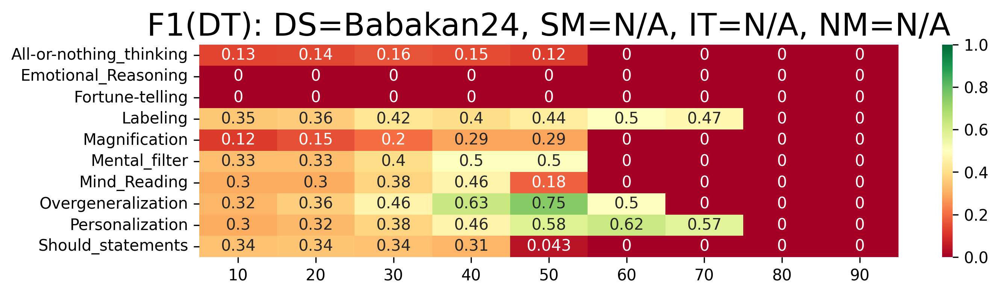

('N/A', 'N/A', 'N/A', 40, 0.31990777136623677, {'All-or-nothing_thinking': 0.14545454545454545, 'Emotional_Reasoning': 0, 'Fortune-telling': 0, 'Labeling': 0.4, 'Magnification': 0.2857142857142857, 'Mental_filter': 0.5, 'Mind_Reading': 0.4615384615384615, 'Overgeneralization': 0.631578947368421, 'Personalization': 0.4615384615384615, 'Should_statements': 0.3132530120481927})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.15, 0, 0, 0.4, 0.29, 0.5, 0.46, 0.63, 0.46, 0.31]


In [75]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, held_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)


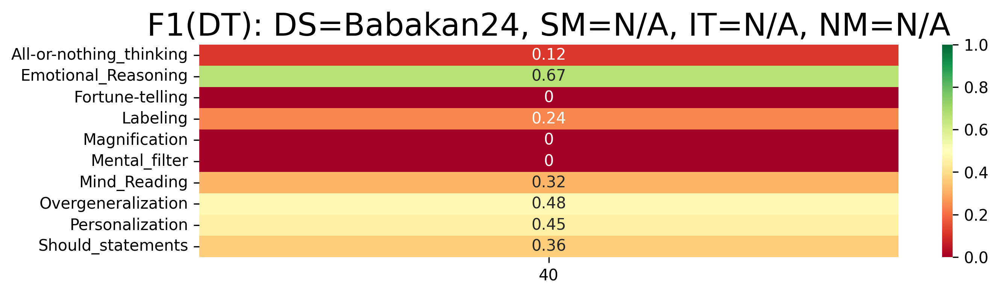

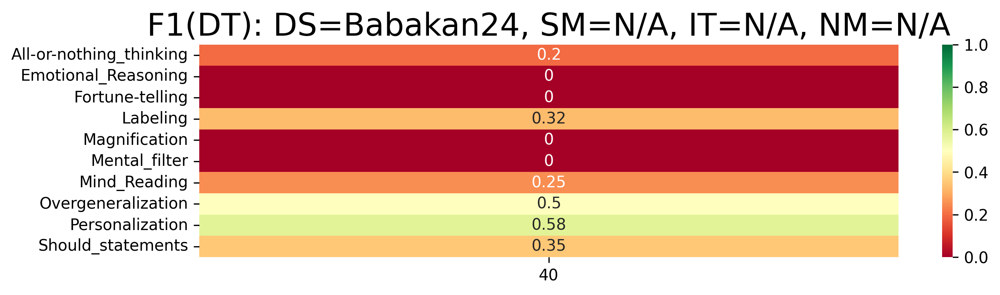

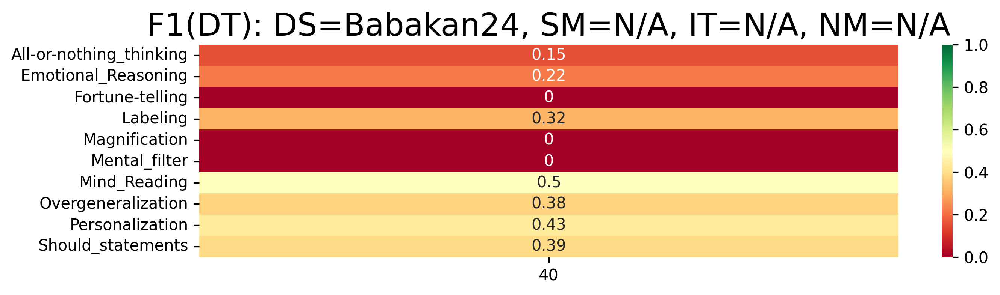

('N/A',
 'N/A',
 'N/A',
 40,
 0.22018787757010197,
 0.2634138480998735,
 0.2409489977349056,
 6.21565852141705)

In [76]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

detection_thresholds = [40] # based on the above

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % 3 == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

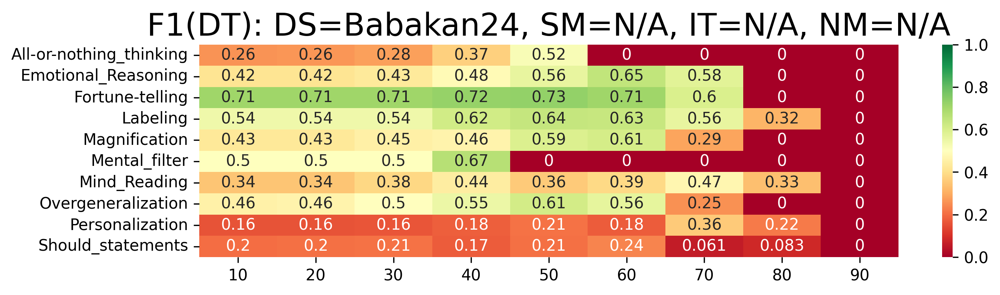

('N/A', 'N/A', 'N/A', 40, 0.4659148146265933, {'All-or-nothing_thinking': 0.3684210526315789, 'Emotional_Reasoning': 0.48076923076923084, 'Fortune-telling': 0.7234042553191489, 'Labeling': 0.6153846153846153, 'Magnification': 0.4615384615384615, 'Mental_filter': 0.6666666666666666, 'Mind_Reading': 0.4444444444444445, 'Overgeneralization': 0.5496183206106869, 'Personalization': 0.17582417582417584, 'Should_statements': 0.1730769230769231})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.37, 0.48, 0.72, 0.62, 0.46, 0.67, 0.44, 0.55, 0.18, 0.17]
0.4659999999999999


In [77]:
# Evaluate joint model (ours 2026) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_26 = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours26')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_26, held_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)
print(sum(numbers_arinicheva)/len(numbers_arinicheva))

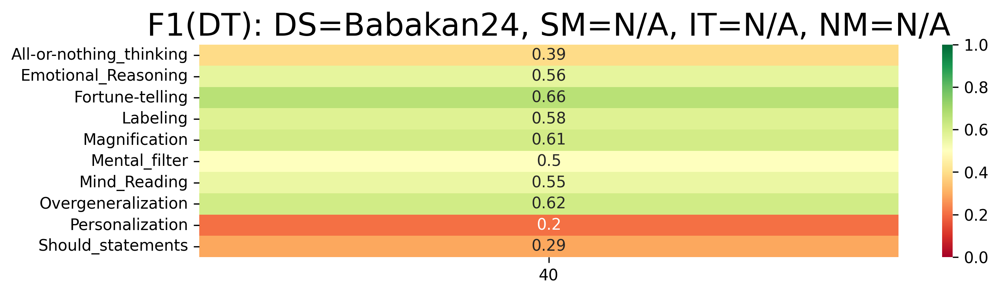

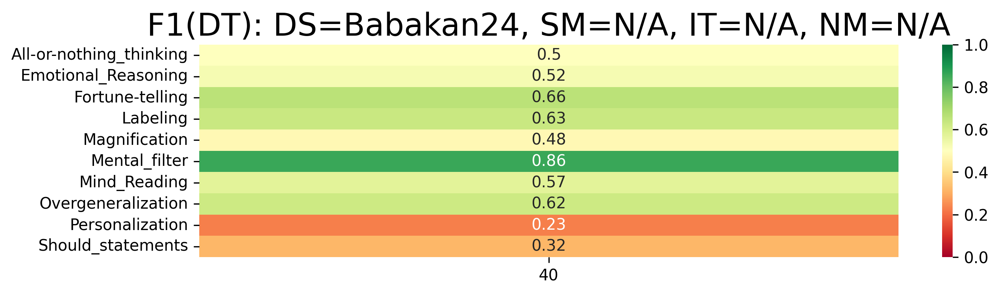

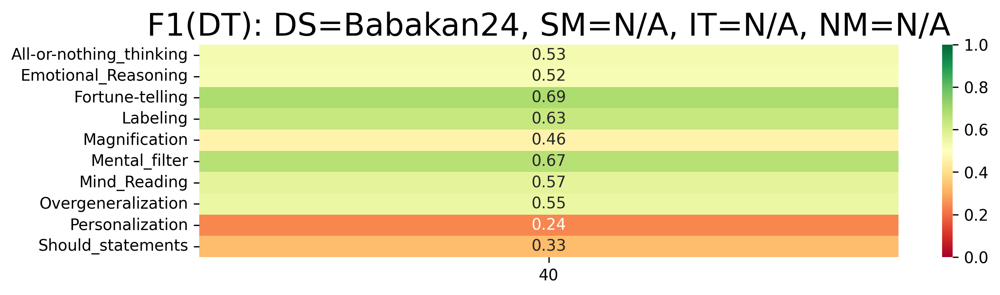

('N/A',
 'N/A',
 'N/A',
 40,
 0.49740068704574397,
 0.538937561646219,
 0.5184175334597677,
 2.702692335495606)

In [78]:
# Evaluate joint model (ours 2026) with splits

detection_thresholds = [40] # based on the above

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % 3 == 0]
    accumulator_base = []
    evaluate_metrics(tm_26, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_cleaned = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_cleaned.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_cleaned = sorted(summary_cleaned, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_cleaned[0]

## Create Final Models with all Inclusion Thresholds

Creating final model for 2 90 MR 40
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=1: train=2899, test=724
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 279, 'Overgeneralization': 280, 'Magnification': 252, 'Labeling': 223, 'Personalization': 227, 'Fortune-telling': 218, 'Emotional_Reasoning': 223, 'Mental_filter': 203, 'Should_statements': 201, 'All-or-nothing_thinking': 189, 'No_Distortion': 604})
Shift=2: train=2899, test=724
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 279, 'Overgeneralization': 283, 'Magnification': 257, 'Labeling': 231, 'Personalization': 225, 'Fortune-telling': 218, 'Emotional_Reasoning': 215, 'Mental_filter': 206, 'Should_statements': 199, 'All-

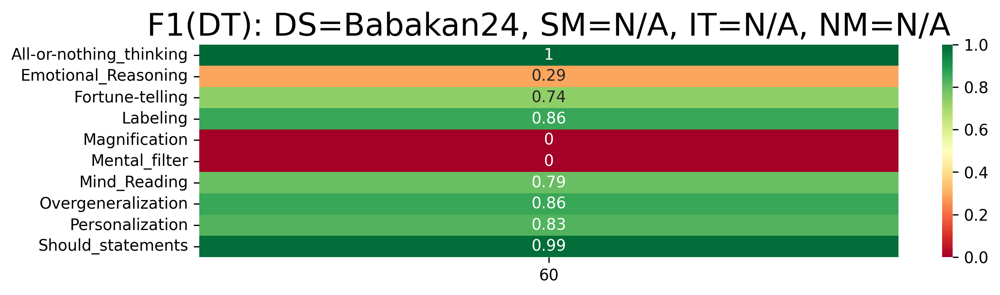

('N/A', 'N/A', 'N/A', 60, 0.6346200280206187, {'All-or-nothing_thinking': 1.0, 'Emotional_Reasoning': 0.2857142857142857, 'Fortune-telling': 0.7368421052631579, 'Labeling': 0.8571428571428571, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0.7941176470588236, 'Overgeneralization': 0.8571428571428571, 'Personalization': 0.8275862068965517, 'Should_statements': 0.9876543209876543, 'Distortion': 0.6138059701492538})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[1.0, 0.61, 0.29, 0.74, 0.86, 0, 0, 0.79, 0.86, 0.83, 0.99]


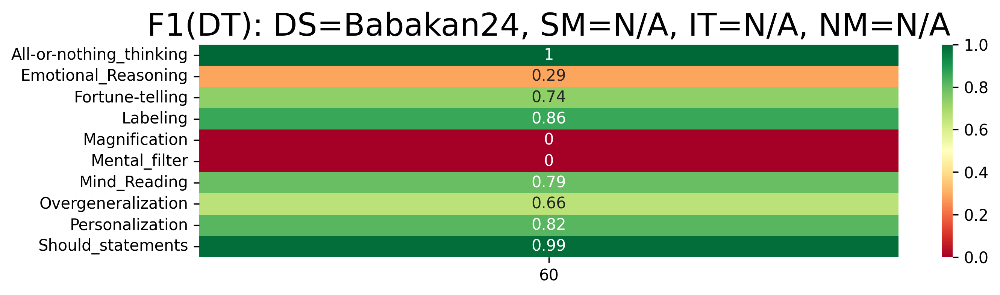

('N/A', 'N/A', 'N/A', 60, 0.6136369452259045, {'All-or-nothing_thinking': 1.0, 'Emotional_Reasoning': 0.2857142857142857, 'Fortune-telling': 0.7368421052631579, 'Labeling': 0.8571428571428571, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0.7941176470588236, 'Overgeneralization': 0.6567164179104478, 'Personalization': 0.8181818181818182, 'Should_statements': 0.9876543209876543, 'Distortion': 0.6216466234967624})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[1.0, 0.62, 0.29, 0.74, 0.86, 0, 0, 0.79, 0.66, 0.82, 0.99]


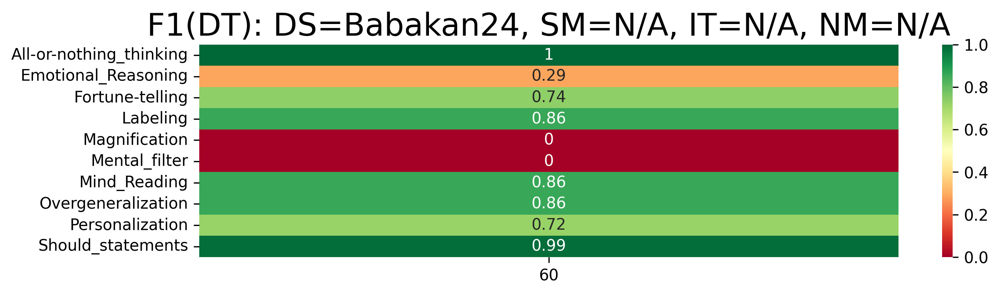

('N/A', 'N/A', 'N/A', 60, 0.630163928339367, {'All-or-nothing_thinking': 1.0, 'Emotional_Reasoning': 0.2857142857142857, 'Fortune-telling': 0.7368421052631579, 'Labeling': 0.8571428571428571, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0.8571428571428571, 'Overgeneralization': 0.8571428571428571, 'Personalization': 0.7200000000000001, 'Should_statements': 0.9876543209876543, 'Distortion': 0.5345167652859961})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[1.0, 0.53, 0.29, 0.74, 0.86, 0, 0, 0.86, 0.86, 0.72, 0.99]


('N/A',
 'N/A',
 'N/A',
 60,
 0.6136369452259045,
 0.6346200280206187,
 0.62614030052863,
 1.3312623695966526)

In [79]:
# Paper section: "Conclusion"

NM=2; IT=90; SM='MR'; DT=40; WT = False

local_t0 = dt.datetime.now()

print('Creating final model for',NM,IT,SM,DT)

results = []
for shift in splits:
    accumulator = []
    for n_max in [NM]:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = [SM],
                weighted=WT,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results.append(accumulator)

summ = summarize_full_test_circle(results)
print()
for s in summ[:20]:
    print(s) 
    
local_t1 = dt.datetime.now()
local_delta = local_t1 - local_t0 
# time for recognition with multiple thresholds of 3 splits each 1/5 of the number of texts in dataset
print('Time to process single text:',str(local_delta/len(detection_thresholds)/(len(df)*3/5)))

print()

all_metrics = {'All-or-nothing_thinking',
              'Fortune-telling',
              'Mental_filter',
              'Overgeneralization',
              'Labeling',
              'Mind_Reading',
              'Personalization',
              'Emotional_Reasoning',
              'Magnification',
              'Should_statements'}

# Evaluate F1 on withheld test set - weighted

detection_thresholds = [60] # [10,20,30,40,50,60,70,80,90]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/{model_name}-{shift+1}-{IT}')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=WT,debug=False)

    test_df  = held_df #[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_weighted = [round(best[5][label],2) for label in labels]
    print(numbers_weighted)
    results_base.append(accumulator)
    
# Print F1 performance of unweighted

summary_final = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_final.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_final = sorted(summary_final, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_final[0]


Creating final model for 2 40 FN 70
Shift=0: train=2898, test=725
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 277, 'Overgeneralization': 284, 'Magnification': 263, 'Labeling': 220, 'Personalization': 222, 'Fortune-telling': 211, 'Emotional_Reasoning': 215, 'Mental_filter': 212, 'Should_statements': 205, 'All-or-nothing_thinking': 191, 'No_Distortion': 598})
Shift=1: train=2899, test=724
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 279, 'Overgeneralization': 280, 'Magnification': 252, 'Labeling': 223, 'Personalization': 227, 'Fortune-telling': 218, 'Emotional_Reasoning': 223, 'Mental_filter': 203, 'Should_statements': 201, 'All-or-nothing_thinking': 189, 'No_Distortion': 604})
Shift=2: train=2899, test=724
Labels count: defaultdict(<class 'int'>, {'Mind_Reading': 279, 'Overgeneralization': 283, 'Magnification': 257, 'Labeling': 231, 'Personalization': 225, 'Fortune-telling': 218, 'Emotional_Reasoning': 215, 'Mental_filter': 206, 'Should_statements': 199, 'All-

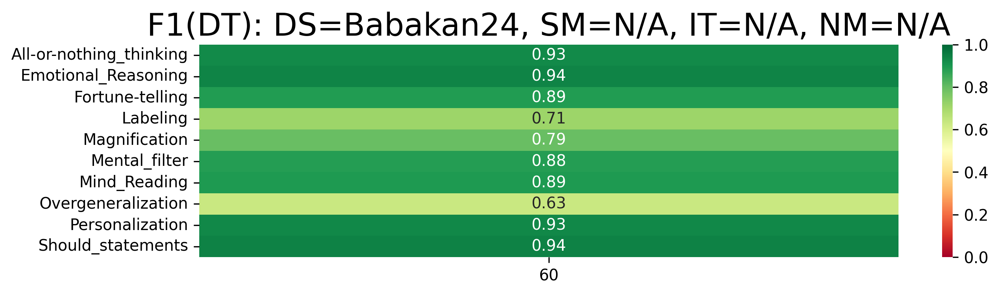

('N/A', 'N/A', 'N/A', 60, 0.8547633967081861, {'All-or-nothing_thinking': 0.9268292682926829, 'Emotional_Reasoning': 0.9397590361445783, 'Fortune-telling': 0.888888888888889, 'Labeling': 0.7142857142857143, 'Magnification': 0.7941176470588236, 'Mental_filter': 0.8842105263157894, 'Mind_Reading': 0.8936170212765958, 'Overgeneralization': 0.6315789473684211, 'Personalization': 0.9318181818181818, 'Should_statements': 0.9425287356321839, 'Distortion': 0.8605527638190955})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.93, 0.86, 0.94, 0.89, 0.71, 0.79, 0.88, 0.89, 0.63, 0.93, 0.94]


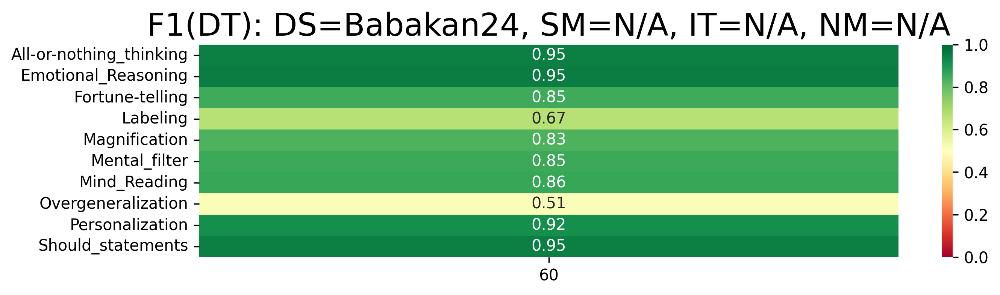

('N/A', 'N/A', 'N/A', 60, 0.8349517563239776, {'All-or-nothing_thinking': 0.951219512195122, 'Emotional_Reasoning': 0.9534883720930233, 'Fortune-telling': 0.8478260869565218, 'Labeling': 0.6666666666666666, 'Magnification': 0.8307692307692308, 'Mental_filter': 0.8541666666666666, 'Mind_Reading': 0.8631578947368421, 'Overgeneralization': 0.5121951219512195, 'Personalization': 0.9176470588235294, 'Should_statements': 0.9523809523809523, 'Distortion': 0.8685857321652064})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.95, 0.87, 0.95, 0.85, 0.67, 0.83, 0.85, 0.86, 0.51, 0.92, 0.95]


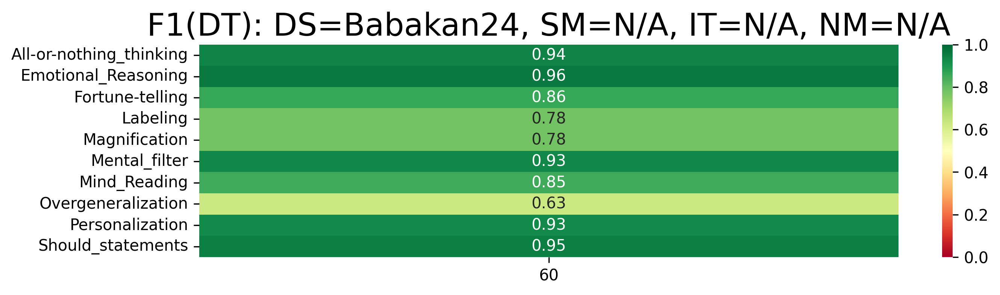

('N/A', 'N/A', 'N/A', 60, 0.8609251485085858, {'All-or-nothing_thinking': 0.9382716049382717, 'Emotional_Reasoning': 0.9629629629629629, 'Fortune-telling': 0.8631578947368421, 'Labeling': 0.7796610169491526, 'Magnification': 0.7777777777777778, 'Mental_filter': 0.9318181818181818, 'Mind_Reading': 0.8484848484848485, 'Overgeneralization': 0.627906976744186, 'Personalization': 0.926829268292683, 'Should_statements': 0.9523809523809524, 'Distortion': 0.8646616541353384})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.94, 0.86, 0.96, 0.86, 0.78, 0.78, 0.93, 0.85, 0.63, 0.93, 0.95]


('N/A',
 'N/A',
 'N/A',
 60,
 0.8349517563239776,
 0.8609251485085858,
 0.8502134338469164,
 1.196693827327983)

In [80]:
# Paper section: "Conclusion"

local_t0 = dt.datetime.now()

NM=2; IT=40; SM='FN'; DT=70; WT = True

print('Creating final model for',NM,IT,SM,DT)

results = []
for shift in splits:
    accumulator = []
    for n_max in [NM]:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}-W',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = [SM],
                weighted=WT,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results.append(accumulator)

summ = summarize_full_test_circle(results)
print()
for s in summ[:20]:
    print(s) 
    
local_t1 = dt.datetime.now()
local_delta = local_t1 - local_t0 
# time for recognition with multiple thresholds of 3 splits each 1/5 of the number of texts in dataset
print('Time to process single text:',str(local_delta/len(detection_thresholds)/(len(df)*3/5)))

print()

all_metrics = {'All-or-nothing_thinking',
              'Fortune-telling',
              'Mental_filter',
              'Overgeneralization',
              'Labeling',
              'Mind_Reading',
              'Personalization',
              'Emotional_Reasoning',
              'Magnification',
              'Should_statements'}

# Evaluate F1 on withheld test set - weighted

detection_thresholds = [60] # [10,20,30,40,50,60,70,80,90]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/{model_name}-{shift+1}-W-{IT}')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=WT,debug=False)

    test_df  = held_df #[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_weighted = [round(best[5][label],2) for label in labels]
    print(numbers_weighted)
    results_base.append(accumulator)
    
# Print F1 performance of weighted

summary_final_weighted = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_final_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_final_weighted = sorted(summary_final_weighted, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_final_weighted[0]

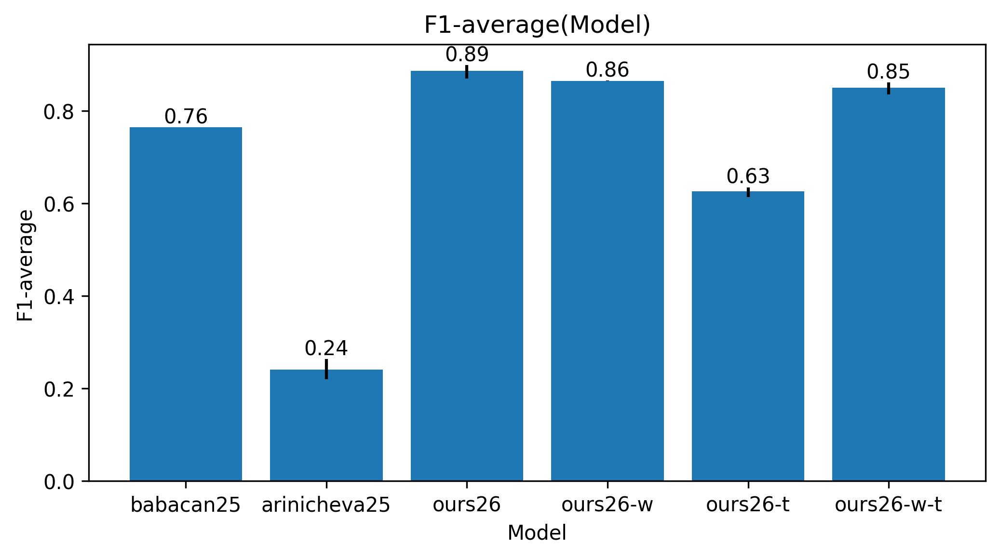

In [81]:
plot_bar_from_list_minmax('Model',
                          ['babacan25','arinicheva25','ours26','ours26-w','ours26-t','ours26-w-t'],
                          'F1-average',
                          [f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6],
                          summary_final[0][6],summary_final_weighted[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5]),
                                 (summary_final[0][4],summary_final[0][5]),
                                  (summary_final_weighted[0][4],summary_final_weighted[0][5])])

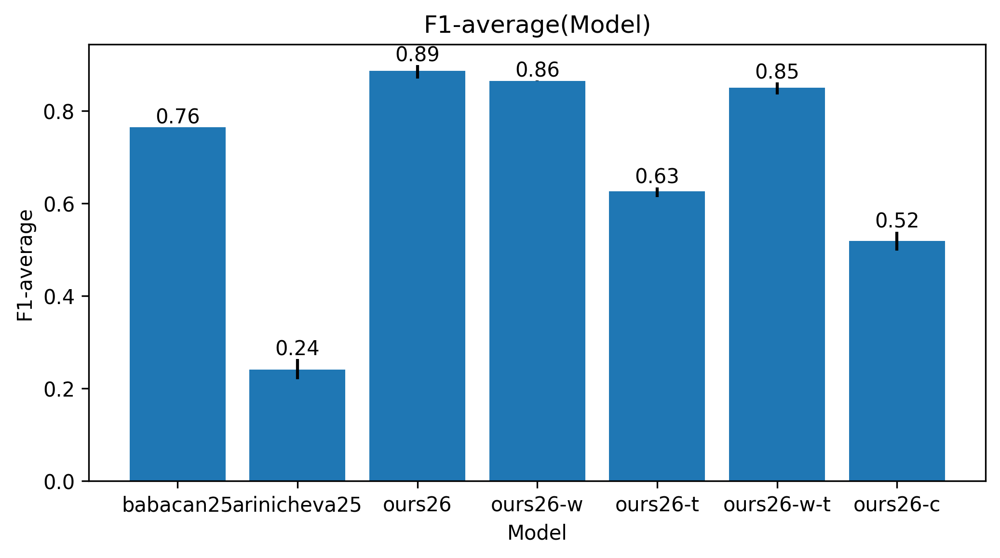

In [82]:
plot_bar_from_list_minmax('Model',
                          ['babacan25','arinicheva25','ours26','ours26-w','ours26-t','ours26-w-t','ours26-c'],
                          'F1-average',
                          [f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6],
                          summary_final[0][6],summary_final_weighted[0][6],summary_cleaned[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5]),
                                  (summary_final[0][4],summary_final[0][5]),
                                  (summary_final_weighted[0][4],summary_final_weighted[0][5]),
                                  (summary_cleaned[0][4],summary_cleaned[0][5])])

In [33]:
# Evaluate the computing time budget

grand_t1 = dt.datetime.now()
grand_delta = grand_t1 - grand_t0
str(grand_delta)

'3:29:24.077324'